<a href="https://colab.research.google.com/github/Nurasssyl/kaz-adm-2/blob/main/shimai_shatpaq.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install geopandas matplotlib


                   source    id           name  \
0  https://simplemaps.com  KZ11         Akmola   
1  https://simplemaps.com  KZ15         Aktobe   
2  https://simplemaps.com  KZ19         Almaty   
3  https://simplemaps.com  KZ75  Almaty (city)   
4  https://simplemaps.com  KZ23         Atyrau   

                                            geometry  
0  MULTIPOLYGON (((68.13862 41.05222, 68.14027 41...  
1  POLYGON ((56.69497 45.15835, 56.69485 45.15901...  
2  POLYGON ((76.22632 46.63167, 76.21110 46.55934...  
3  MULTIPOLYGON (((76.96553 43.37987, 76.96560 43...  
4  MULTIPOLYGON (((53.68008 49.19527, 53.75788 49...  


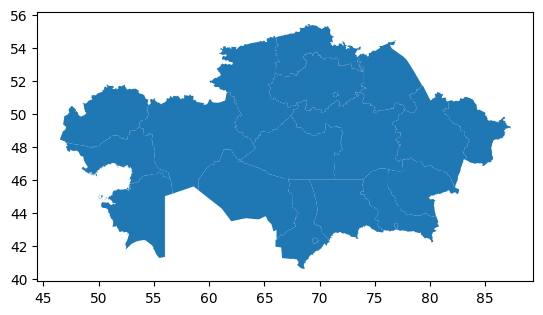

In [7]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Путь к JSON файлу
json_file_path = '/content/new-kz-adm-borders.json'

# Загрузка GeoJSON файла
gdf = gpd.read_file(json_file_path)

# Просмотр первых строк данных
print(gdf.head())

# Визуализация данных
gdf.plot()
plt.show()



                   source    id           name  \
0  https://simplemaps.com  KZ11         Akmola   
1  https://simplemaps.com  KZ15         Aktobe   
2  https://simplemaps.com  KZ19         Almaty   
3  https://simplemaps.com  KZ75  Almaty (city)   
4  https://simplemaps.com  KZ23         Atyrau   

                                            geometry  
0  MULTIPOLYGON (((68.13862 41.05222, 68.14027 41...  
1  POLYGON ((56.69497 45.15835, 56.69485 45.15901...  
2  POLYGON ((76.22632 46.63167, 76.21110 46.55934...  
3  MULTIPOLYGON (((76.96553 43.37987, 76.96560 43...  
4  MULTIPOLYGON (((53.68008 49.19527, 53.75788 49...  
['KZ11' 'KZ15' 'KZ19' 'KZ75' 'KZ23' 'KZ10' 'KZ31' 'KZ62' 'KZ39' 'KZ43'
 'KZ47' 'KZ59' 'KZ71' 'KZ55' 'KZ79' 'KZ61' 'KZ27' 'KZ35' 'KZ33' 'KZ63']
                   source    id           name  \
3  https://simplemaps.com  KZ75  Almaty (city)   

                                            geometry  
3  MULTIPOLYGON (((76.96553 43.37987, 76.96560 43...  


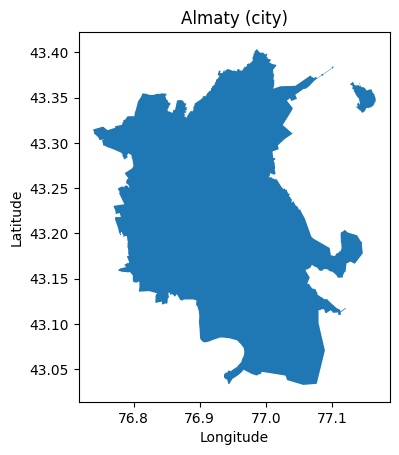

In [11]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Путь к JSON файлу
json_file_path = '/content/new-kz-adm-borders.json'

# Загрузка GeoJSON файла
gdf = gpd.read_file(json_file_path)

# Просмотр первых строк данных
print(gdf.head())

# Проверка уникальных значений в столбце 'id'
print(gdf['id'].unique())

# Фильтрация данных по коду региона KZ75
almaty_city_gdf = gdf[gdf['id'] == 'KZ75']

# Проверка отфильтрованных данных
print(almaty_city_gdf)

# Визуализация отфильтрованных данных
almaty_city_gdf.plot()
plt.title('Almaty (city)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Если необходимо, можно сохранить отфильтрованные данные в новый файл
output_path = '/content/almaty_city.geojson'
almaty_city_gdf.to_file(output_path, driver='GeoJSON')


In [12]:
# Вычисление площади региона
almaty_city_gdf['area'] = almaty_city_gdf.area
print(almaty_city_gdf[['id', 'name', 'area']])


     id           name     area
3  KZ75  Almaty (city)  0.07799


<ipython-input-12-a5e058230839>:2: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  almaty_city_gdf['area'] = almaty_city_gdf.area
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<ipython-input-13-8c19933e7b37>:2: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  almaty_city_gdf['buffered'] = almaty_city_gdf.buffer(0.01)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


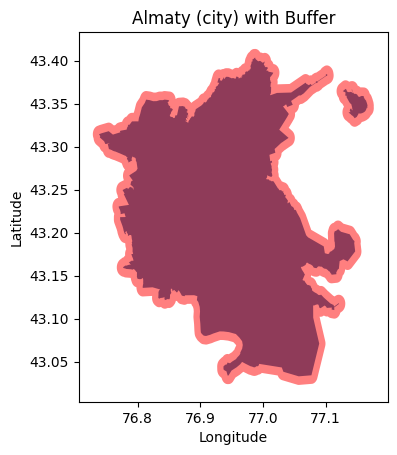

In [13]:
# Создание буферной зоны в 0.01 градуса
almaty_city_gdf['buffered'] = almaty_city_gdf.buffer(0.01)

# Визуализация оригинальной и буферной геометрии
ax = almaty_city_gdf.plot()
almaty_city_gdf['buffered'].plot(ax=ax, color='red', alpha=0.5)
plt.title('Almaty (city) with Buffer')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


Current CRS: EPSG:4326
Transformed CRS: EPSG:3857
     id           name          area
3  KZ75  Almaty (city)  1.326117e+09


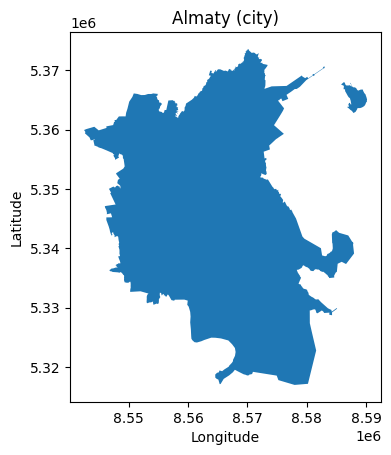

In [19]:


# Фильтрация данных по коду региона KZ75
almaty_city_gdf = gdf[gdf['id'] == 'KZ75']

# Проверка текущей CRS
print(f"Current CRS: {almaty_city_gdf.crs}")

# Преобразование CRS в проекцию с метрами (EPSG:3857)
almaty_city_gdf = almaty_city_gdf.to_crs(epsg=3857)

# Проверка преобразованной CRS
print(f"Transformed CRS: {almaty_city_gdf.crs}")

# Вычисление площади региона в квадратных метрах
almaty_city_gdf['area'] = almaty_city_gdf['geometry'].area

# Просмотр площади региона
print(almaty_city_gdf[['id', 'name', 'area']])

# Визуализация отфильтрованных данных
almaty_city_gdf.plot()
plt.title('Almaty (city)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


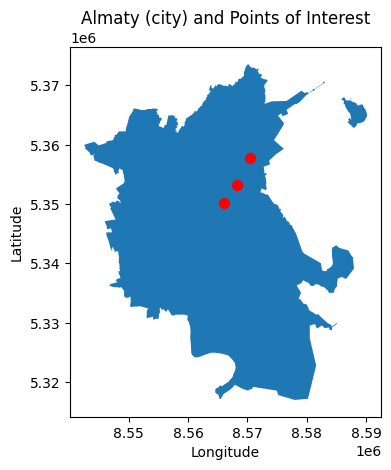

In [20]:
from shapely.geometry import Point

# Пример точек интереса (например, больницы или школы)
points_of_interest = gpd.GeoDataFrame({
    'name': ['Point1', 'Point2', 'Point3'],
    'geometry': [Point(76.95, 43.25), Point(76.97, 43.27), Point(76.99, 43.30)]
}, crs="EPSG:4326")

# Преобразование CRS для совместимости
points_of_interest = points_of_interest.to_crs(epsg=3857)

# Визуализация региона и точек интереса
ax = almaty_city_gdf.plot()
points_of_interest.plot(ax=ax, color='red', markersize=50)
plt.title('Almaty (city) and Points of Interest')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


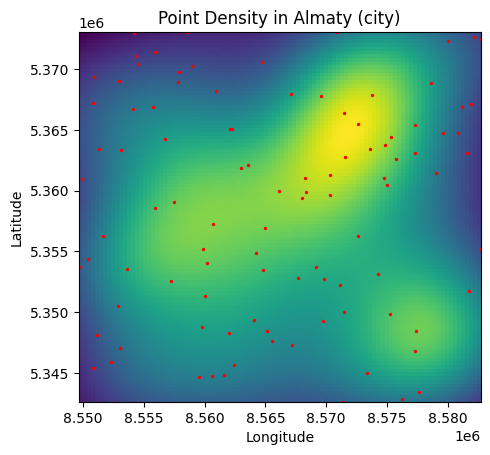

In [21]:
from scipy.stats import gaussian_kde
import numpy as np

# Пример случайных точек внутри региона
points = [Point(np.random.uniform(76.8, 77.1), np.random.uniform(43.2, 43.4)) for _ in range(100)]
points_gdf = gpd.GeoDataFrame(geometry=points, crs="EPSG:4326")

# Преобразование CRS для совместимости
points_gdf = points_gdf.to_crs(epsg=3857)

# Получение координат точек
x, y = points_gdf.geometry.x, points_gdf.geometry.y

# Оценка плотности
kde = gaussian_kde([x, y])
xi, yi = np.mgrid[x.min():x.max():100j, y.min():y.max():100j]
zi = kde(np.vstack([xi.flatten(), yi.flatten()]))

# Визуализация карты плотности
fig, ax = plt.subplots()
ax.imshow(zi.reshape(xi.shape), origin='lower', aspect='auto', cmap='viridis', extent=[x.min(), x.max(), y.min(), y.max()])
points_gdf.plot(ax=ax, markersize=2, color='red')
plt.title('Point Density in Almaty (city)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


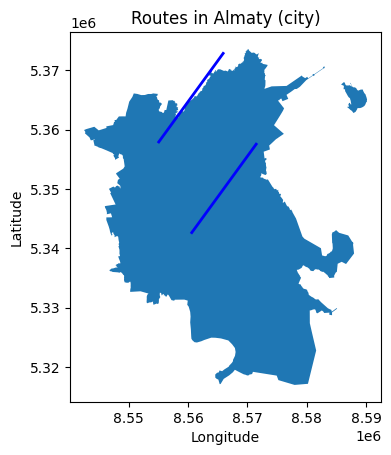

In [22]:
from shapely.geometry import LineString

# Пример маршрутов
routes = [
    LineString([(76.9, 43.2), (76.95, 43.25), (77.0, 43.3)]),
    LineString([(76.85, 43.3), (76.9, 43.35), (76.95, 43.4)])
]
routes_gdf = gpd.GeoDataFrame(geometry=routes, crs="EPSG:4326")

# Преобразование CRS для совместимости
routes_gdf = routes_gdf.to_crs(epsg=3857)

# Визуализация региона и маршрутов
ax = almaty_city_gdf.plot()
routes_gdf.plot(ax=ax, color='blue', linewidth=2)
plt.title('Routes in Almaty (city)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


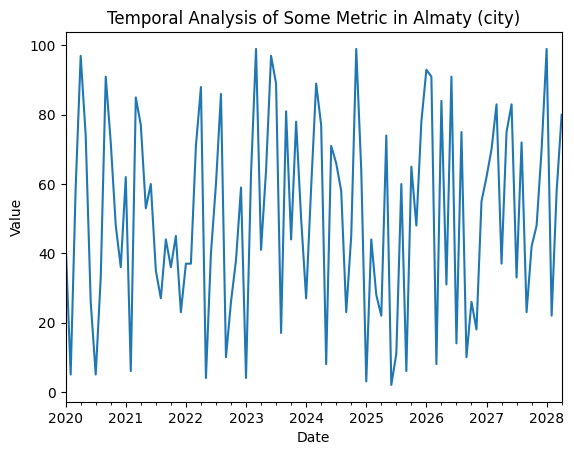

In [23]:
import pandas as pd

# Пример данных с временными метками
data = {
    'date': pd.date_range(start='1/1/2020', periods=100, freq='M'),
    'value': np.random.randint(1, 100, 100)
}
time_series_df = pd.DataFrame(data)

# Визуализация временного ряда
time_series_df.plot(x='date', y='value', legend=False)
plt.title('Temporal Analysis of Some Metric in Almaty (city)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.show()


In [24]:
# Пример категориальных данных
almaty_city_gdf['category'] = ['A', 'B', 'A', 'C', 'B'] * (len(almaty_city_gdf) // 5)

# Визуализация категориальных данных
almaty_city_gdf.plot(column='category', cmap='Set3', legend=True)
plt.title('Categorical Data in Almaty (city)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


ValueError: Length of values (0) does not match length of index (1)

In [27]:
!wget https://github.com/arodionoff/geokz/raw/main/maps/kaz_admbnda_adm2_2024.shp
!wget https://github.com/arodionoff/geokz/raw/main/maps/kaz_admbnda_adm2_2024.shx
!wget https://github.com/arodionoff/geokz/raw/main/maps/kaz_admbnda_adm2_2024.dbf
!wget https://github.com/arodionoff/geokz/raw/main/maps/kaz_admbnda_adm2_2024.prj


--2024-07-26 12:09:37--  https://github.com/arodionoff/geokz/raw/main/maps/kaz_admbnda_adm2_2024.shp
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/arodionoff/geokz/main/maps/kaz_admbnda_adm2_2024.shp [following]
--2024-07-26 12:09:37--  https://raw.githubusercontent.com/arodionoff/geokz/main/maps/kaz_admbnda_adm2_2024.shp
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1020936 (997K) [application/octet-stream]
Saving to: ‘kaz_admbnda_adm2_2024.shp’

kaz_admbnda_adm2_20 100%[===================>] 997.01K  --.-KB/s    in 0.03s   

2024-07-26 12:09:38 (30.0 MB/s) - ‘kaz_admbnda_adm2_2024.shp’ sav

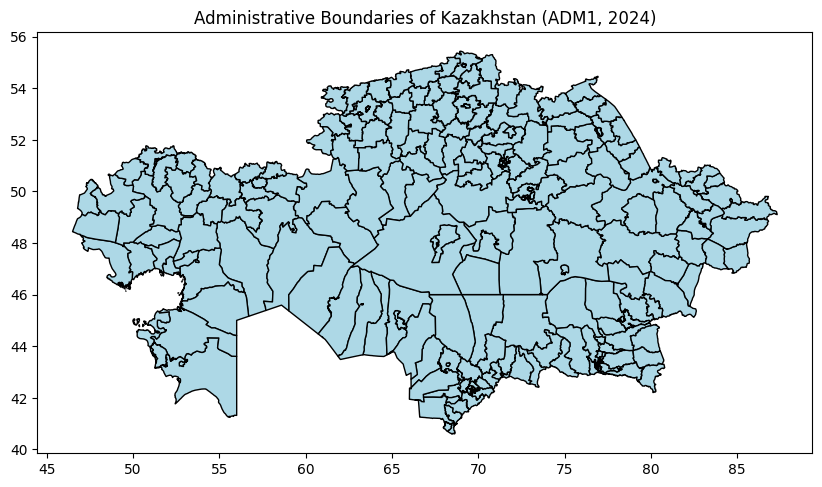

In [28]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the shapefile
gdf = gpd.read_file("kaz_admbnda_adm2_2024.shp")

# Plot the shapefile
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
gdf.plot(ax=ax, color='lightblue', edgecolor='black')
ax.set_title("Administrative Boundaries of Kazakhstan (ADM1, 2024)")
plt.show()

In [29]:
gdf = gpd.read_file("kaz_admbnda_adm2_2024.shp")

# Шаг 4: Конвертация в GeoJSON
geojson_path = "kaz_admbnda_adm2_2024.geojson"
gdf.to_file(geojson_path, driver="GeoJSON")

# Шаг 5: Чтение и вывод содержимого GeoJSON
import json

with open(geojson_path, "r") as file:
    geojson_data = json.load(file)

# Вывод содержимого GeoJSON
print(json.dumps(geojson_data, indent=2))

{
  "type": "FeatureCollection",
  "crs": {
    "type": "name",
    "properties": {
      "name": "urn:ogc:def:crs:OGC:1.3:CRS84"
    }
  },
  "features": [
    {
      "type": "Feature",
      "properties": {
        "KATO": "101000000",
        "ADM0_EN": "Republic of Kazakhstan",
        "ADM0_KK": "\u00d2\u009a\u00d0\u00b0\u00d0\u00b7\u00d0\u00b0\u00d2\u009b\u00d1\u0081\u00d1\u0082\u00d0\u00b0\u00d0\u00bd \u00d0\u00a0\u00d0\u00b5\u00d1\u0081\u00d0\u00bf\u00d1\u0083\u00d0\u00b1\u00d0\u00bb\u00d0\u00b8\u00d0\u00ba\u00d0\u00b0\u00d1\u0081\u00d1\u008b",
        "ADM0_RU": "\u00d0\u00a0\u00d0\u00b5\u00d1\u0081\u00d0\u00bf\u00d1\u0083\u00d0\u00b1\u00d0\u00bb\u00d0\u00b8\u00d0\u00ba\u00d0\u00b0 \u00d0\u009a\u00d0\u00b0\u00d0\u00b7\u00d0\u00b0\u00d1\u0085\u00d1\u0081\u00d1\u0082\u00d0\u00b0\u00d0\u00bd",
        "ADM0_PCODE": "KZ",
        "ADM1_EN": "Abay",
        "ADM1_KK": "\u00d0\u0090\u00d0\u00b1\u00d0\u00b0\u00d0\u00b9",
        "ADM1_RU": "\u00d0\u0090\u00d0\u00b1\u00d0\u00b0\u00d0

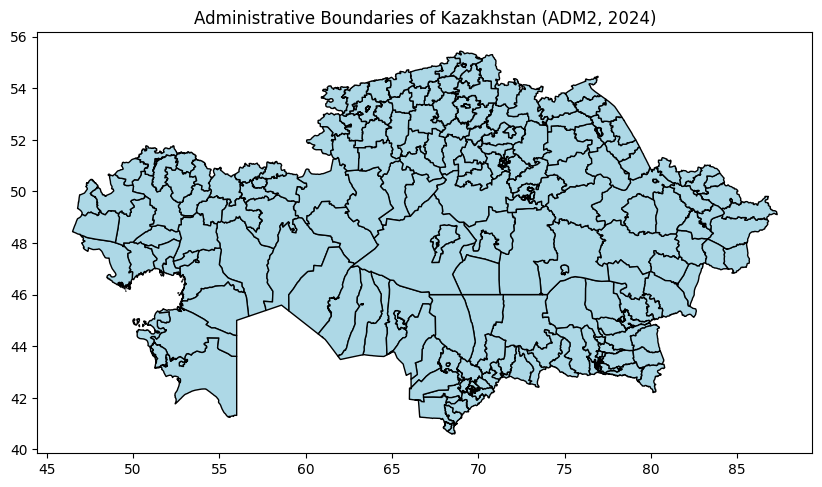

In [30]:
geojson_path = "/content/kaz_admbnda_adm2_2024.geojson"
gdf = gpd.read_file(geojson_path)

# Визуализация GeoJSON файла
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
gdf.plot(ax=ax, color='lightblue', edgecolor='black')
ax.set_title("Administrative Boundaries of Kazakhstan (ADM2, 2024)")
plt.show()

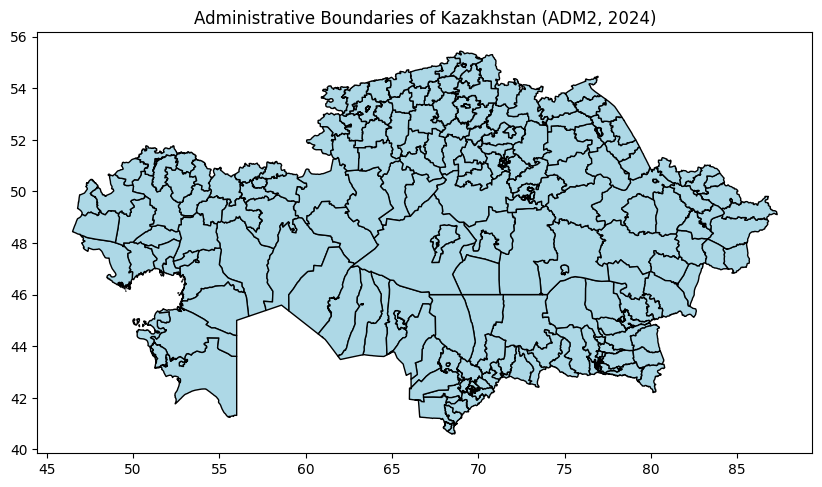

In [31]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Убедитесь, что имя файла совпадает с именем загруженного файла
geojson_path = "/content/kaz_admbnda_adm2_2024.geojson"
gdf = gpd.read_file(geojson_path)

# Визуализация GeoJSON файла
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
gdf.plot(ax=ax, color='lightblue', edgecolor='black')
ax.set_title("Administrative Boundaries of Kazakhstan (ADM2, 2024)")
plt.show()


In [34]:
print(gdf.columns)  # Выводит список всех столбцов в GeoDataFrame


Index(['KATO', 'ADM0_EN', 'ADM0_KK', 'ADM0_RU', 'ADM0_PCODE', 'ADM1_EN',
       'ADM1_KK', 'ADM1_RU', 'ADM1_PCODE', 'ADM2_EN', 'ADM2_KK', 'ADM2_RU',
       'ADM2_PCODE', 'geometry'],
      dtype='object')


In [37]:
# Шаг 1: Создание данных и сохранение в CSV
data = {
    'ADM2_PCODE': ['01', '02', '03', '04', '05'],  # Пример кодов для административных единиц
    'value': [100, 200, 150, 300, 250]  # Пример значений для визуализации
}

# Создание DataFrame и сохранение в CSV
df = pd.DataFrame(data)
df.to_csv('region_values.csv', index=False)  # Сохранение в текущую директорию


In [39]:
# Шаг 3: Объединение данных
gdf = gdf.merge(df, on="ADM2_PCODE")
gdf

,KATO,ADM0_EN,ADM0_KK,ADM0_RU,ADM0_PCODE,ADM1_EN,ADM1_KK,ADM1_RU,ADM1_PCODE,ADM2_EN,ADM2_KK,ADM2_RU,geometry,value_x,ADM2_PCODE,value_y


In [40]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Шаг 1: Создание данных и сохранение в CSV
data = {
    'ADM2_PCODE': ['01', '02', '03', '04', '05'],  # Пример кодов для административных единиц
    'value': [100, 200, 150, 300, 250]  # Пример значений для визуализации
}

# Создание DataFrame и сохранение в CSV
df = pd.DataFrame(data)
df.to_csv('region_values.csv', index=False)  # Сохранение в текущую директорию

# Шаг 2: Загрузка геоданных
geojson_path = "kaz_admbnda_adm2_2024.geojson"  # Убедитесь, что путь правильный
data_path = "region_values.csv"  # Путь к вашему файлу CSV

# Загрузка GeoDataFrame
gdf = gpd.read_file(geojson_path)
df = pd.read_csv(data_path)

# Шаг 3: Объединение данных
gdf = gdf.merge(df, on="ADM2_PCODE")

# Шаг 4: Визуализация с цветовой схемой
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
gdf.plot(column='value', ax=ax, legend=True, cmap='OrRd', edgecolor='black')
ax.set_title("Administrative Boundaries of Kazakhstan (ADM2, 2024) with Values")
plt.show()


ValueError: You are trying to merge on object and int64 columns. If you wish to proceed you should use pd.concat

In [43]:
import pandas as pd

# Загрузка данных из CSV с указанием разделителя
data_path = "/content/Audandar-natural-growth.csv"
df = pd.read_csv(data_path, encoding='latin1', delimiter=';')

# Просмотр первых строк для понимания структуры
print(df.head())
print(df.columns)



   number ADM2_PCODE  Population Kazakhs     ADM2_EN    ADM2_KK  \
0       1   KZ101000    331040.0  244379       Semey      Ñåìåé   
1       2   KZ101010         NaN     NaN  Zharasemey  Æà?àñåìåé   
2       3   KZ101800     10253.0    6181   Kurchatov   Êóð÷àòîâ   
3       4   KZ103200     13793.0   13629        Abay       Àáàé   
4       5   KZ103400     19195.0   19231      Aqsuat     À?ñóàò   

         ADM2_RU ISO_3166_2   Area     Male   Female Percentage_of_Kazakhs  \
0          Ñåìåé    KZ-ABY1    210  158 728  172 133                   74%   
1  Æàíàñåìåéñêèé    KZ-ABY1  27100      NaN      NaN                   NaN   
2       Êóð÷àòîâ    KZ-ABY1    110    5 050    5 296                   60%   
3       Àáàéñêèé    KZ-ABY1  20093    6 953    6 869                   99%   
4     Àêñóàòñêèé    KZ-ABY1  13600    9 930    9 402                  100%   

   color difference  
0    1.0      2 435  
1    NaN        NaN  
2    1.0         76  
3    1.0         93  
4    1.0        21

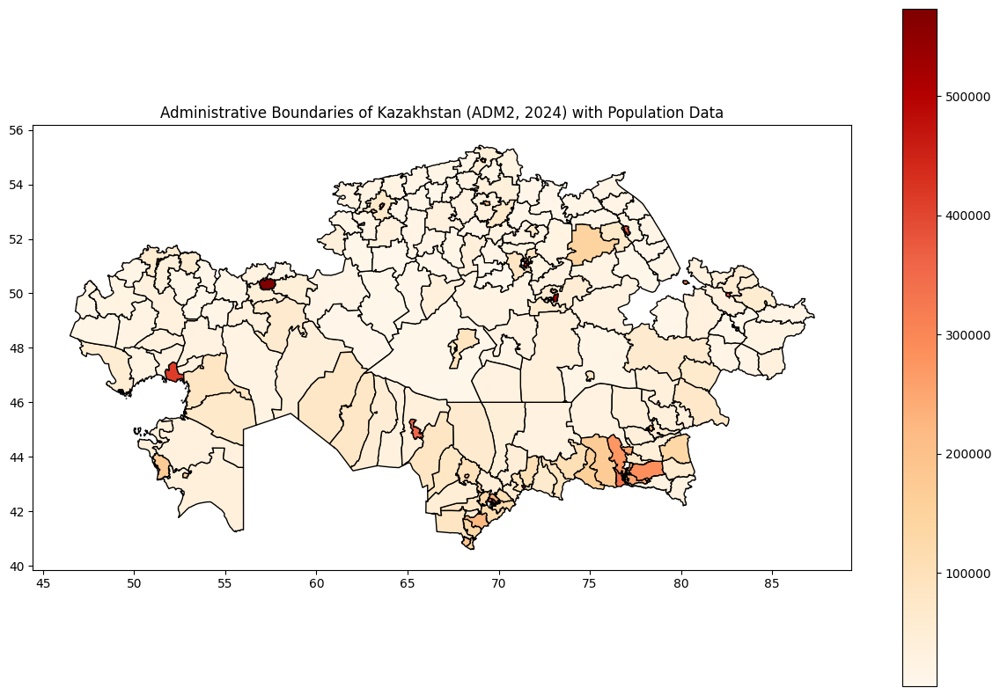

In [44]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Шаг 1: Загрузка данных из CSV с указанием разделителя
data_path = "/content/Audandar-natural-growth.csv"
df = pd.read_csv(data_path, encoding='latin1', delimiter=';')

# Преобразование ADM2_PCODE в строку
df['ADM2_PCODE'] = df['ADM2_PCODE'].astype(str)

# Шаг 2: Загрузка геоданных
geojson_path = "/content/kaz_admbnda_adm2_2024.geojson"  # Убедитесь, что путь правильный
gdf = gpd.read_file(geojson_path)

# Преобразование ADM2_PCODE в строку
gdf['ADM2_PCODE'] = gdf['ADM2_PCODE'].astype(str)

# Шаг 3: Объединение данных
gdf = gdf.merge(df, on="ADM2_PCODE")

# Шаг 4: Визуализация с цветовой схемой
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
gdf.plot(column='Population', ax=ax, legend=True, cmap='OrRd', edgecolor='black')
ax.set_title("Administrative Boundaries of Kazakhstan (ADM2, 2024) with Population Data")
plt.show()


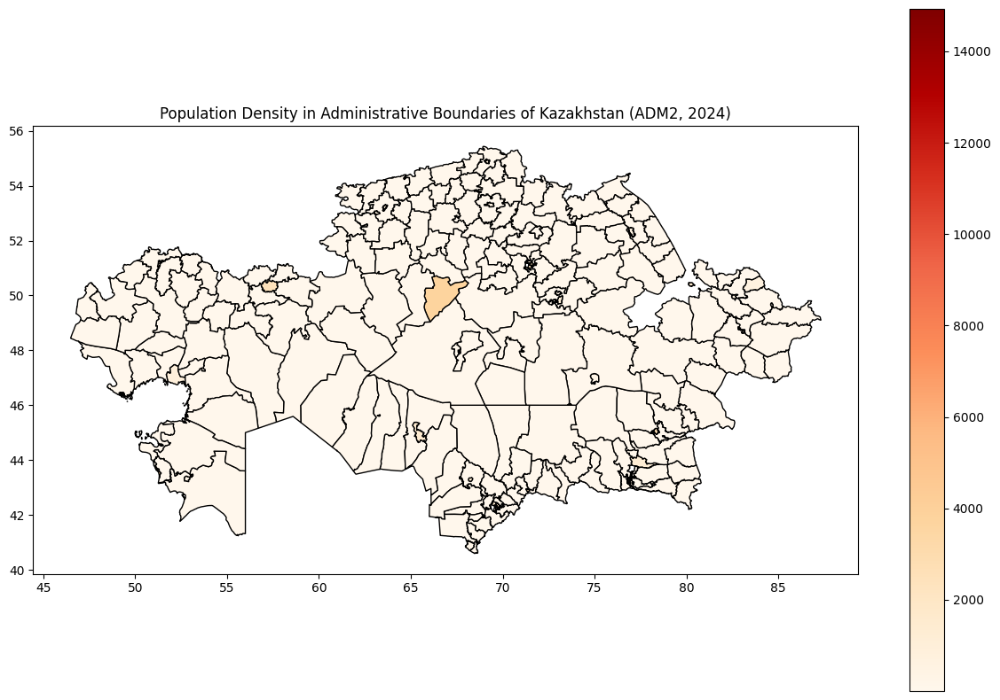

In [45]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Шаг 1: Загрузка данных из CSV с указанием разделителя
data_path = "/content/Audandar-natural-growth.csv"
df = pd.read_csv(data_path, encoding='latin1', delimiter=';')

# Преобразование ADM2_PCODE в строку
df['ADM2_PCODE'] = df['ADM2_PCODE'].astype(str)

# Преобразование Area в числовой тип
df['Area'] = df['Area'].replace({' ': ''}, regex=True).astype(float)

# Расчет плотности населения
df['Population Density'] = df['Population'] / df['Area']

# Шаг 2: Загрузка геоданных
geojson_path = "/content/kaz_admbnda_adm2_2024.geojson"  # Убедитесь, что путь правильный
gdf = gpd.read_file(geojson_path)

# Преобразование ADM2_PCODE в строку
gdf['ADM2_PCODE'] = gdf['ADM2_PCODE'].astype(str)

# Шаг 3: Объединение данных
gdf = gdf.merge(df, on="ADM2_PCODE")

# Шаг 4: Визуализация с цветовой схемой
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
gdf.plot(column='Population Density', ax=ax, legend=True, cmap='OrRd', edgecolor='black')
ax.set_title("Population Density in Administrative Boundaries of Kazakhstan (ADM2, 2024)")
plt.show()


  ADM2_PCODE  Population     Area
0   KZ101000    331040.0    210.0
1   KZ101010         NaN  27100.0
2   KZ101800     10253.0    110.0
3   KZ103200     13793.0  20093.0
4   KZ103400     19195.0  13600.0
  ADM2_PCODE  Population Density
0   KZ101000         1576.380952
1   KZ101010                 NaN
2   KZ101800           93.209091
3   KZ103200            0.686458
4   KZ103400            1.411397


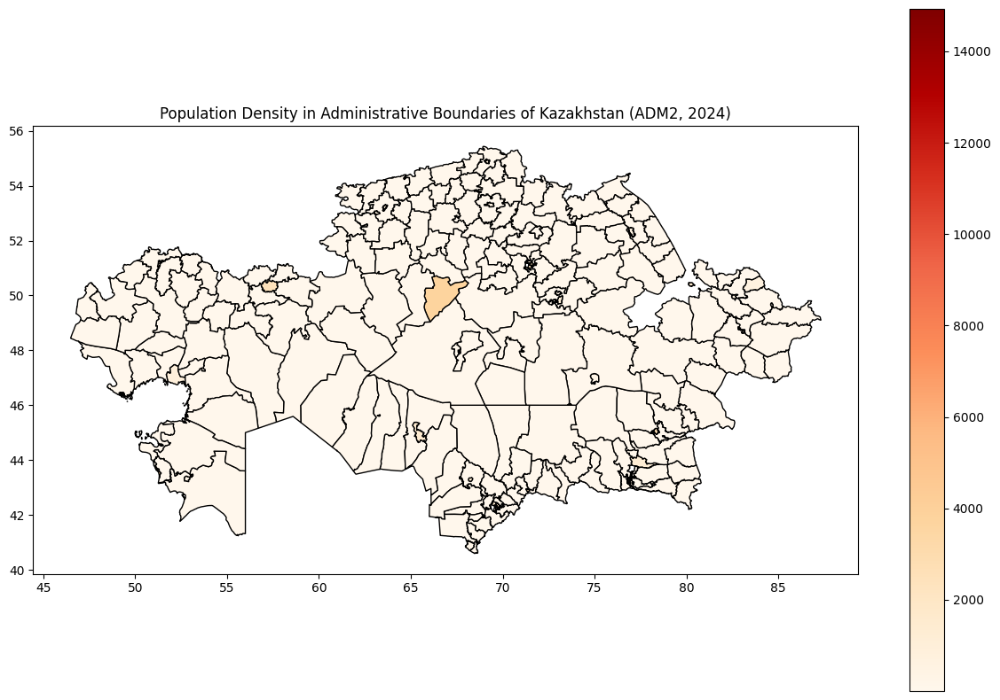

In [46]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Шаг 1: Загрузка данных из CSV с указанием разделителя
data_path = "/content/Audandar-natural-growth.csv"
df = pd.read_csv(data_path, encoding='latin1', delimiter=';')

# Преобразование ADM2_PCODE в строку
df['ADM2_PCODE'] = df['ADM2_PCODE'].astype(str)

# Удаление пробелов из Area и преобразование в числовой тип
df['Area'] = df['Area'].replace({' ': ''}, regex=True).astype(float)

# Проверка данных Population и Area на корректность
print(df[['ADM2_PCODE', 'Population', 'Area']].head())

# Расчет плотности населения
df['Population Density'] = df['Population'] / df['Area']

# Проверка рассчитанной плотности населения
print(df[['ADM2_PCODE', 'Population Density']].head())

# Шаг 2: Загрузка геоданных
geojson_path = "/content/kaz_admbnda_adm2_2024.geojson"  # Убедитесь, что путь правильный
gdf = gpd.read_file(geojson_path)

# Преобразование ADM2_PCODE в строку
gdf['ADM2_PCODE'] = gdf['ADM2_PCODE'].astype(str)

# Шаг 3: Объединение данных
gdf = gdf.merge(df, on="ADM2_PCODE")

# Шаг 4: Визуализация с цветовой схемой
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
gdf.plot(column='Population Density', ax=ax, legend=True, cmap='OrRd', edgecolor='black')
ax.set_title("Population Density in Administrative Boundaries of Kazakhstan (ADM2, 2024)")
plt.show()


ValueError: The number of FixedLocator locations (7), usually from a call to set_ticks, does not match the number of labels (6).

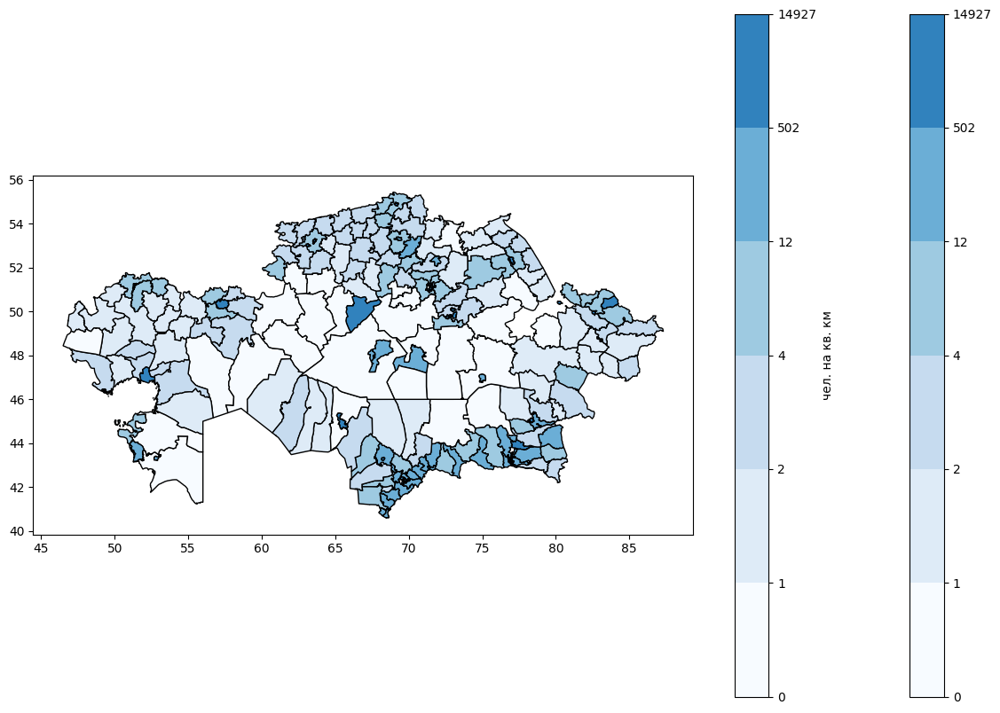

In [49]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import BoundaryNorm, ListedColormap

# Шаг 1: Загрузка данных из CSV с указанием разделителя
data_path = "/content/Audandar-natural-growth.csv"
df = pd.read_csv(data_path, encoding='latin1', delimiter=';')

# Преобразование ADM2_PCODE в строку
df['ADM2_PCODE'] = df['ADM2_PCODE'].astype(str)

# Удаление пробелов из Area и преобразование в числовой тип
df['Area'] = df['Area'].replace({' ': ''}, regex=True).astype(float)

# Расчет плотности населения
df['Population Density'] = df['Population'] / df['Area']

# Шаг 2: Загрузка геоданных
geojson_path = "/content/kaz_admbnda_adm2_2024.geojson"  # Убедитесь, что путь правильный
gdf = gpd.read_file(geojson_path)

# Преобразование ADM2_PCODE в строку
gdf['ADM2_PCODE'] = gdf['ADM2_PCODE'].astype(str)

# Шаг 3: Объединение данных
gdf = gdf.merge(df, on="ADM2_PCODE")

# Определение границ для цветовой шкалы
bounds = [0, 1, 2, 4, 12, 502, 14927]
norm = BoundaryNorm(bounds, ncolors=6, clip=True)
cmap = ListedColormap(['#f7fbff', '#deebf7', '#c6dbef', '#9ecae1', '#6baed6', '#3182bd', '#08519c'])

# Шаг 4: Визуализация с цветовой схемой
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
gdf.plot(column='Population Density', ax=ax, legend=True, cmap=cmap, edgecolor='black',
         norm=norm)

# Настройка легенды
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('чел. на кв. км')
cbar.set_ticks(bounds)
cbar.set_ticklabels(['0 to 1', '1 to 2', '2 to 4', '4 to 12', '12 to 502', '502 to 14,927'])

ax.set_title("Population Density in Administrative Boundaries of Kazakhstan (ADM2, 2024)")
plt.show()
